In [50]:
import numpy as np
import matplotlib.pyplot as plt
from cellpose import models, io
from cellpose.io import imread
from tifffile import imread
from skimage import exposure
import cv2
from matplotlib.colors import ListedColormap
from scipy import ndimage
from skimage.measure import regionprops


# Set up logging
io.logger_setup()

2025-05-08 15:34:38,729 [INFO] WRITING LOG OUTPUT TO /home/lyarab/.cellpose/run.log
2025-05-08 15:34:38,729 [INFO] 
cellpose version: 	3.1.1.1 
platform:       	linux 
python version: 	3.12.0 
torch version:  	2.6.0+cu124


(<Logger cellpose.io (INFO)>, PosixPath('/home/lyarab/.cellpose/run.log'))

## Try Nuclear Segmentation

In [37]:
file_path = '/media/Lynn/data/CODEX_cropped/cellpose_test/cropped_spot_1_column_1_slide_1.ome.ome.tif'

# Read the image
img = imread(file_path)
print(f"Image shape: {img.shape}")

# Create model
model = models.Cellpose(model_type='nuclei')

# Channel 0 represents nuclei staining (DAPI)
selected_channel = 0 

# If the image is already in shape [H, W, C], extract the channel
if len(img.shape) == 3 and img.shape[2] == 27:  # If channels are last dimension
    selected_img = img[:, :, selected_channel]
# If the image is in shape [C, H, W], extract the channel
elif len(img.shape) == 3 and img.shape[0] == 27:  # If channels are first dimension
    selected_img = img[selected_channel, :, :]
# Other cases
else:
    print(f"Unexpected image shape: {img.shape}. Please reshape manually.")
    selected_img = img  

print(f"Selected channel image shape: {selected_img.shape}")

# Name of the channel(s) to be used for segmentation. If one channel, must be a nucleus channel. If a list of channels, it must be a cytoplasmic channel and then a nucleus channel.
channels = [0, 0]  # This means use the same grayscale image for both detection steps

# Ensure the image is 2D
if len(selected_img.shape) > 2:
    print("Warning: Reshaping the image to 2D")
    selected_img = selected_img.reshape(selected_img.shape[:2])

# Specify diameter, None means it is auto-estimated
diameter = None  
masks, flows, styles, diams = model.eval([selected_img], 
                                        diameter=diameter, 
                                        channels=channels)

print(f"Estimated diameter: {diams[0]}")
print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")


Image shape: (27, 560, 670)
2025-05-02 13:02:20,208 [INFO] >>>> using CPU
2025-05-02 13:02:20,208 [INFO] >>>> using CPU
2025-05-02 13:02:20,209 [INFO] >> nuclei << model set to be used
2025-05-02 13:02:20,254 [INFO] >>>> loading model /home/lyarab/.cellpose/models/nucleitorch_0
2025-05-02 13:02:20,341 [INFO] >>>> model diam_mean =  17.000 (ROIs rescaled to this size during training)
Selected channel image shape: (560, 670)
2025-05-02 13:02:20,346 [INFO] channels set to [0, 0]
2025-05-02 13:02:20,346 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2025-05-02 13:02:28,946 [INFO] estimated cell diameter(s) in 8.60 sec
2025-05-02 13:02:28,947 [INFO] >>> diameter(s) = 
2025-05-02 13:02:28,948 [INFO] [9.90, ]
2025-05-02 13:02:28,948 [INFO] ~~~ FINDING MASKS ~~~
2025-05-02 13:02:30,843 [INFO] >>>> TOTAL TIME 10.50 sec
Estimated diameter: 9.901487006738309
Segmentation completed with 770 cells detected


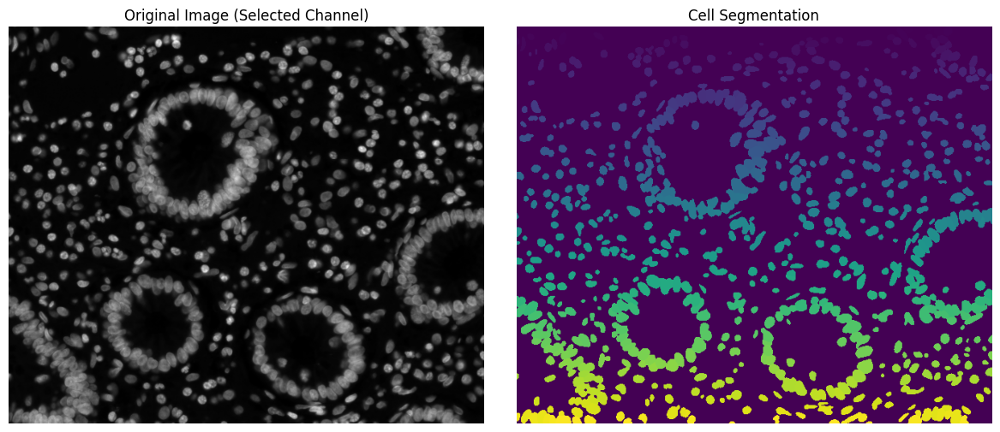

In [38]:
# Visualize results
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.imshow(selected_img, cmap='gray')
plt.title('Original Image (Selected Channel)')
plt.axis('off')

plt.subplot(122)
plt.imshow(masks[0], cmap='viridis')
plt.title('Cell Segmentation')
plt.axis('off')

plt.tight_layout()
plt.show()

In [24]:
?masks

Type:        list
String form:
[array([[0, 0, 0, ..., 0, 0, 0],
           [0, 0, 0, ..., 0, 0, 0],
           [0, 0, 0, ..., 0, 0, 0],
           <...> 0, ..., 0, 0, 0],
           [0, 0, 0, ..., 0, 0, 0],
           [0, 0, 0, ..., 0, 0, 0]], dtype=uint16)]
Length:      1
Docstring:  
Built-in mutable sequence.

If no argument is given, the constructor creates a new empty list.
The argument must be an iterable if specified.

In [25]:
diams

[np.float64(9.901487006738309)]

In [27]:
flows

[[array([[[ 1, 35, 23],
          [ 0,  6, 12],
          [ 0,  0,  2],
          ...,
          [ 1,  1,  0],
          [ 1,  1,  0],
          [ 1,  0,  0]],
  
         [[ 3, 20,  7],
          [ 1,  2,  8],
          [ 0,  0,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
  
         [[ 2, 16,  6],
          [ 4,  2, 12],
          [ 0,  0,  1],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
  
         ...,
  
         [[79, 52,  2],
          [89, 26, 18],
          [43,  6, 15],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
  
         [[33, 23,  0],
          [24,  7,  5],
          [11,  2,  3],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 0,  0,  0]],
  
         [[15, 12,  0],
          [10,  5,  0],
          [ 5,  2,  0],
          ...,
          [ 0,  0,  0],
          [ 0,  0,  0],
          [ 1,  0,  0]]], dtype=u

In [28]:
styles

[array([ 0.00619621, -0.06377935,  0.01293722,  0.00969416,  0.00928536,
         0.01253799,  0.02346523,  0.03978493,  0.02975892, -0.02135521,
         0.00667165, -0.06503615,  0.09262464,  0.06003717,  0.07222058,
        -0.01894663, -0.15863846,  0.04919628, -0.00523217,  0.05221161,
         0.06206283,  0.0142719 , -0.05865957,  0.02698674, -0.01152409,
         0.01086654, -0.0079181 ,  0.05103014, -0.03487788, -0.04900382,
         0.12243455, -0.05407143,  0.01546637, -0.00120588, -0.02432706,
        -0.05657083, -0.01117731, -0.05194787,  0.02063389, -0.05546585,
         0.03447377, -0.00318364,  0.02324572,  0.07488175,  0.02846454,
        -0.00490009, -0.03757572,  0.06090507,  0.04567888,  0.02683879,
        -0.03147088,  0.04398418,  0.0771856 , -0.01115844, -0.06477823,
        -0.03032857, -0.00817636, -0.00327783,  0.03221035,  0.00597821,
        -0.02835024,  0.11269792,  0.02286162, -0.00026972,  0.05918119,
         0.06546348, -0.00835683, -0.04189252,  0.0

## Pool cytoplasmic markers intensities to do cyto segmentation

In [ ]:
file_path = '/media/Lynn/data/CODEX_cropped/cellpose_test/cropped_spot_1_column_1_slide_1.ome.ome.tif'

img = imread(file_path)
print(f"Image shape: {img.shape}")

# Define which channels correspond to your markers of interest
channel_indices = {
    'aSMA': 2,          
    'CD31': 5,         
    'Pan-Cytokeratin': 8,  
    'CD45': 19          
}

#### Pool with Maximum Intensity Projection followed by min/max Normalization

In [17]:
pooled_img = None

if len(img.shape) == 3:
    if img.shape[0] == 27:  # Channels first [C, H, W]
        # Extract each channel and create a maximum intensity projection
        channels_to_pool = [img[channel_indices[marker], :, :] for marker in channel_indices]
        pooled_img = np.max(channels_to_pool, axis=0)
        
    elif img.shape[2] == 27:  # Channels last [H, W, C]
        # Extract each channel and create a maximum intensity projection
        channels_to_pool = [img[:, :, channel_indices[marker]] for marker in channel_indices]
        pooled_img = np.max(channels_to_pool, axis=0)
    
else:
    print(f"Unexpected image shape: {img.shape}. Please reshape manually.")

print(f"Pooled image shape: {pooled_img.shape}")

# Normalize the pooled image for better contrast if needed
# This can improve segmentation quality
pooled_img = (pooled_img - np.min(pooled_img)) / (np.max(pooled_img) - np.min(pooled_img)) * 255
pooled_img = pooled_img.astype(np.uint8)

# Create model 
model = models.Cellpose(model_type='cyto3')

# Select nuclear channel
nuclear_channel = 0  

if nuclear_channel is not None:
    if img.shape[0] == 27:  # Channels first
        nuc_img = img[nuclear_channel, :, :]
    else:  # Channels last
        nuc_img = img[:, :, nuclear_channel]
    
    # Normalize nuclear channel
    nuc_img = (nuc_img - np.min(nuc_img)) / (np.max(nuc_img) - np.min(nuc_img)) * 255
    nuc_img = nuc_img.astype(np.uint8)
    
    # Stack images for cellpose (expected shape: [H, W, 2])
    segmentation_input = np.stack([pooled_img, nuc_img], axis=-1)
    channels = [1, 2]  # First channel for cytoplasm, second for nucleus
else:
    # If no nuclear channel, use only the pooled image
    segmentation_input = pooled_img
    channels = [0, 0]  # Use the same channel for both cytoplasm and nucleus detection

# Set diameter
diameter = None  

masks, flows, styles, diams = model.eval([segmentation_input], 
                                       diameter=diameter,
                                       channels=channels)

print(f"Estimated diameter: {diams[0]}")
print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")

Image shape: (27, 560, 670)
Selected channel indices:
aSMA: 2
CD31: 5
Pan-Cytokeratin: 8
CD45: 19
Pooled image shape: (560, 670)
2025-05-08 08:57:34,254 [INFO] >>>> using CPU
2025-05-08 08:57:34,254 [INFO] >>>> using CPU
2025-05-08 08:57:34,255 [INFO] >> cyto3 << model set to be used
2025-05-08 08:57:34,301 [INFO] >>>> loading model /home/lyarab/.cellpose/models/cyto3
2025-05-08 08:57:34,384 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2025-05-08 08:57:34,390 [INFO] channels set to [1, 2]
2025-05-08 08:57:34,390 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2025-05-08 08:57:40,272 [INFO] estimated cell diameter(s) in 5.88 sec
2025-05-08 08:57:40,272 [INFO] >>> diameter(s) = 
2025-05-08 08:57:40,273 [INFO] [13.98, ]
2025-05-08 08:57:40,273 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 08:57:42,900 [INFO] >>>> TOTAL TIME 8.51 sec
Estimated diameter: 13.980048343817066
Segmentation completed with 767 cells detected


/tmp/ipykernel_88/3916986379.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))


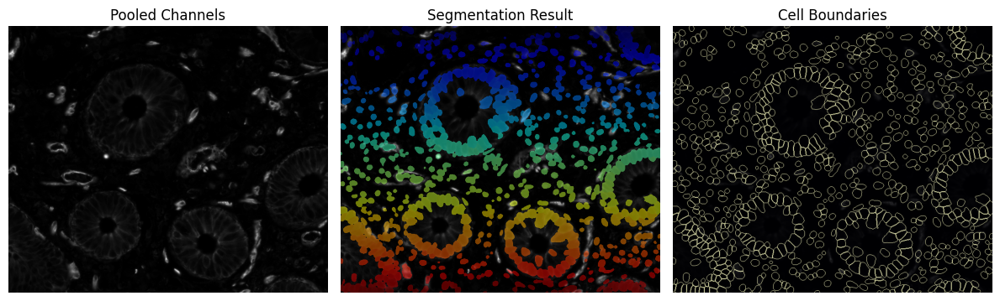

In [16]:
# Visualize results
plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.imshow(pooled_img, cmap='gray')
plt.title('Pooled Channels')
plt.axis('off')

plt.subplot(1, 3, 2)
# Create a custom colormap for mask visualization
from matplotlib.colors import ListedColormap
mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make 0 values transparent
mask_cmap = ListedColormap(mask_cmap)

plt.imshow(pooled_img, cmap='gray')
plt.imshow(masks[0], cmap=mask_cmap, alpha=0.5)
plt.title('Segmentation Result')
plt.axis('off')

# Show outlines only for clearer boundary visualization
plt.subplot(1, 3, 3)
outlines = np.zeros_like(pooled_img)
for i in range(1, masks[0].max()+1):
    cell = masks[0] == i
    # Create boundary by dilating and subtracting
    dilated = ndimage.binary_dilation(cell)
    boundary = dilated & ~cell
    outlines[boundary] = 255

plt.imshow(pooled_img, cmap='gray')
plt.imshow(outlines, cmap='magma', alpha=0.8)
plt.title('Cell Boundaries')
plt.axis('off')

plt.tight_layout()
plt.show()

#### Play with the parameters

In [21]:
flow_threshold = 0.4  # default is 0.4
cellprob_threshold = 0  # (default is 0.0, lowest)
min_size = 40  # higher
resample = True  # set to True (default) to help with cell detection at different sizes
stitch_threshold = 0.0  # default

masks1, flows1, styles1, diams1 = model.eval([segmentation_input], 
                                          diameter=diameter,
                                          channels=channels,
                                          flow_threshold=flow_threshold,
                                          cellprob_threshold=cellprob_threshold,
                                          min_size=min_size,
                                          resample=resample,
                                          stitch_threshold=stitch_threshold)

2025-05-08 09:09:41,272 [INFO] channels set to [1, 2]
2025-05-08 09:09:41,273 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2025-05-08 09:09:47,558 [INFO] estimated cell diameter(s) in 6.29 sec
2025-05-08 09:09:47,559 [INFO] >>> diameter(s) = 
2025-05-08 09:09:47,560 [INFO] [13.98, ]
2025-05-08 09:09:47,560 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 09:09:50,135 [INFO] >>>> TOTAL TIME 8.86 sec


In [22]:
print(f"Segmentation completed with {len(np.unique(masks1[0])) - 1} cells detected")

Segmentation completed with 746 cells detected


/tmp/ipykernel_88/3124321323.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))


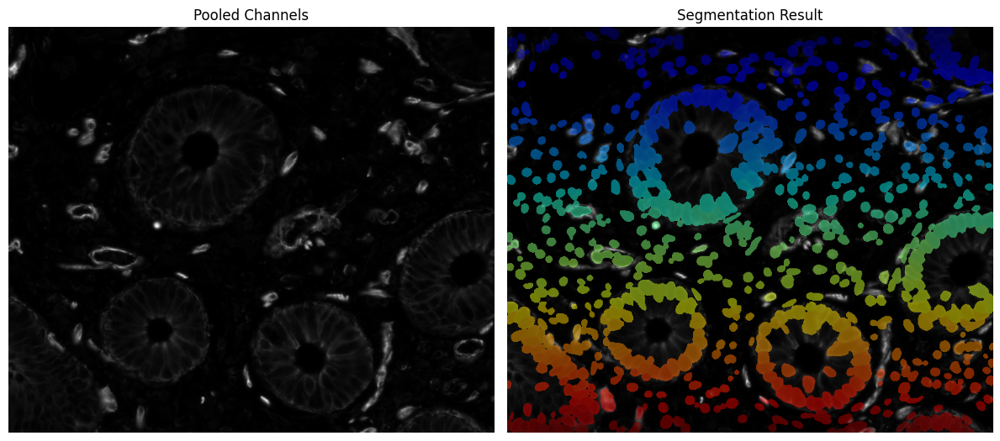

In [23]:
# Visualize results
plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.imshow(pooled_img, cmap='gray')
plt.title('Pooled Channels')
plt.axis('off')

plt.subplot(1, 3, 2)
# Create a custom colormap for mask visualization
from matplotlib.colors import ListedColormap
mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make 0 values transparent
mask_cmap = ListedColormap(mask_cmap)

plt.imshow(pooled_img, cmap='gray')
plt.imshow(masks1[0], cmap=mask_cmap, alpha=0.5)
plt.title('Segmentation Result')
plt.axis('off')

# Show outlines only for clearer boundary visualization
plt.subplot(1, 3, 3)
outlines = np.zeros_like(pooled_img)
for i in range(1, masks1[0].max()+1):
    cell = masks1[0] == i
    # Create boundary by dilating and subtracting
    dilated = ndimage.binary_dilation(cell)
    boundary = dilated & ~cell
    outlines[boundary] = 255

plt.imshow(pooled_img, cmap='gray')
plt.imshow(outlines, cmap='magma', alpha=0.8)
plt.title('Cell Boundaries')
plt.axis('off')

plt.tight_layout()
plt.show()



In [39]:
masks2, flows2, styles2, diams2 = model.eval([segmentation_input], 
                                          diameter=20,
                                          channels=channels,
                                          flow_threshold=0.4,  # higher threshold
                                          cellprob_threshold=0, 
                                          min_size=30,
                                          resample=True)

print(f"Segmentation completed with {len(np.unique(masks2[0])) - 1} cells detected")

2025-05-08 09:52:30,873 [INFO] channels set to [1, 2]
2025-05-08 09:52:30,874 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 09:52:33,136 [INFO] >>>> TOTAL TIME 2.26 sec
Segmentation completed with 737 cells detected


/tmp/ipykernel_88/2677150503.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))


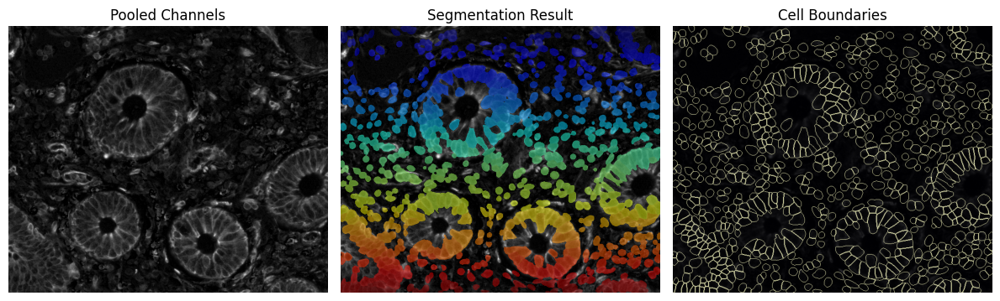

In [40]:
# Visualize results
plt.figure(figsize=(12, 8))

plt.subplot(1, 3, 1)
plt.imshow(pooled_img, cmap='gray')
plt.title('Pooled Channels')
plt.axis('off')

plt.subplot(1, 3, 2)
# Create a custom colormap for mask visualization
from matplotlib.colors import ListedColormap
mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make 0 values transparent
mask_cmap = ListedColormap(mask_cmap)

plt.imshow(pooled_img, cmap='gray')
plt.imshow(masks2[0], cmap=mask_cmap, alpha=0.5)
plt.title('Segmentation Result')
plt.axis('off')

# Show outlines only for clearer boundary visualization
plt.subplot(1, 3, 3)
outlines = np.zeros_like(pooled_img)
for i in range(1, masks2[0].max()+1):
    cell = masks2[0] == i
    # Create boundary by dilating and subtracting
    dilated = ndimage.binary_dilation(cell)
    boundary = dilated & ~cell
    outlines[boundary] = 255

plt.imshow(pooled_img, cmap='gray')
plt.imshow(outlines, cmap='magma', alpha=0.8)
plt.title('Cell Boundaries')
plt.axis('off')

plt.tight_layout()
plt.savefig('segmentation_result.png', dpi=300)
plt.show()

#### Pool with Weighted Sum method followed by min/max normalization. Test different contrast adjustment methods

In [51]:
# Specify file path
file_path = '/media/Lynn/data/CODEX_cropped/cellpose_test/cropped_spot_1_column_1_slide_1.ome.ome.tif'

# Read the image
img = imread(file_path)
print(f"Image shape: {img.shape}")

# Define which channels correspond to your markers of interest
channel_indices = {
    'aSMA': 2,          
    'CD31': 5,         
    'Pan-Cytokeratin': 8,  
    'CD45': 19          
}

# Print the selected channels for verification
print("Selected channel indices:")
for marker, index in channel_indices.items():
    print(f"{marker}: {index}")

# Extract channels based on the shape of your image
pooled_img = None

if len(img.shape) == 3:
    if img.shape[0] == 27:  # Channels first [C, H, W]
        # Extract each channel for individual analysis and weighting
        channel_images = {}
        for marker, idx in channel_indices.items():
            channel_images[marker] = img[idx, :, :]
            print(f"{marker} intensity range: {np.min(channel_images[marker])} - {np.max(channel_images[marker])}")
        
        # Method: Weighted sum with normalization
        normalized_channels = {}
        for marker, channel in channel_images.items():
            # Normalize each channel to 0-1 range
            if np.max(channel) > np.min(channel):  # Avoid division by zero
                normalized_channels[marker] = (channel - np.min(channel)) / (np.max(channel) - np.min(channel))
            else:
                normalized_channels[marker] = np.zeros_like(channel)
        
        # Equal weights to all channels (can be adjusted based on marker importance)
        weights = {marker: 1.0 for marker in channel_indices}
        
        # Create weighted sum
        pooled_img_weighted = np.zeros_like(normalized_channels[list(normalized_channels.keys())[0]], dtype=float)
        for marker, channel in normalized_channels.items():
            pooled_img_weighted += weights[marker] * channel
        
        # Normalize the result
        if np.max(pooled_img_weighted) > np.min(pooled_img_weighted):
            pooled_img_weighted = (pooled_img_weighted - np.min(pooled_img_weighted)) / (np.max(pooled_img_weighted) - np.min(pooled_img_weighted))
        
        pooled_img = pooled_img_weighted
        
    elif img.shape[2] == 27:  # Channels last [H, W, C]
        # Same operations but for channels-last format
        channel_images = {}
        for marker, idx in channel_indices.items():
            channel_images[marker] = img[:, :, idx]
            print(f"{marker} intensity range: {np.min(channel_images[marker])} - {np.max(channel_images[marker])}")
        
        # Method: Weighted sum
        normalized_channels = {}
        for marker, channel in channel_images.items():
            if np.max(channel) > np.min(channel):
                normalized_channels[marker] = (channel - np.min(channel)) / (np.max(channel) - np.min(channel))
            else:
                normalized_channels[marker] = np.zeros_like(channel)
        
        weights = {marker: 1.0 for marker in channel_indices}
        
        pooled_img_weighted = np.zeros_like(normalized_channels[list(normalized_channels.keys())[0]], dtype=float)
        for marker, channel in normalized_channels.items():
            pooled_img_weighted += weights[marker] * channel
        
        if np.max(pooled_img_weighted) > np.min(pooled_img_weighted):
            pooled_img_weighted = (pooled_img_weighted - np.min(pooled_img_weighted)) / (np.max(pooled_img_weighted) - np.min(pooled_img_weighted))
        
        pooled_img = pooled_img_weighted
    
else:
    print(f"Unexpected image shape: {img.shape}. Please reshape manually.")

Image shape: (27, 560, 670)
Selected channel indices:
aSMA: 2
CD31: 5
Pan-Cytokeratin: 8
CD45: 19
aSMA intensity range: 0 - 18621
CD31 intensity range: 0 - 19508
Pan-Cytokeratin intensity range: 0 - 5981
CD45 intensity range: 0 - 2296


Image shape: (27, 560, 670)
Selected channel indices:
aSMA: 2
CD31: 5
Pan-Cytokeratin: 8
CD45: 19
aSMA intensity range: 0 - 18621
CD31 intensity range: 0 - 19508
Pan-Cytokeratin intensity range: 0 - 5981
CD45 intensity range: 0 - 2296


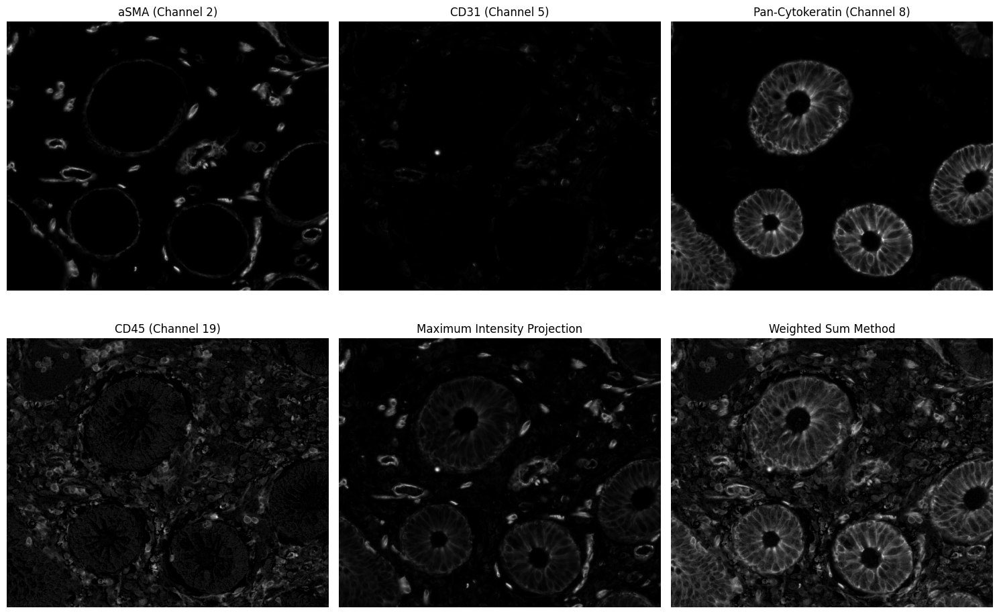

Pooled image shape: (560, 670)


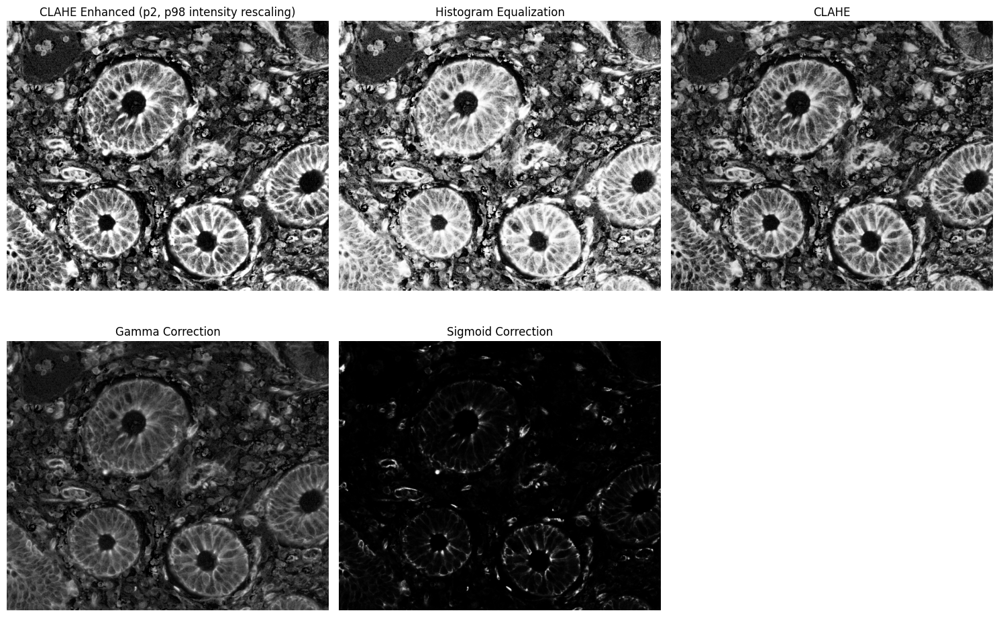

In [11]:
# Visualize individual channels and pooled results
plt.figure(figsize=(15, 10))
plot_idx = 1

# Show each individual channel
for marker, idx in channel_indices.items():
    plt.subplot(2, 3, plot_idx)
    if img.shape[0] == 27:  # Channels first
        plt.imshow(img[idx, :, :], cmap='gray')
    else:  # Channels last
        plt.imshow(img[:, :, idx], cmap='gray')
    plt.title(f'{marker} (Channel {idx})')
    plt.axis('off')
    plot_idx += 1

# Show the pooled results
if 'pooled_img_mip' in locals():
    plt.subplot(2, 3, plot_idx)
    plt.imshow(pooled_img_mip, cmap='gray')
    plt.title('Maximum Intensity Projection')
    plt.axis('off')
    plot_idx += 1

plt.subplot(2, 3, plot_idx)
plt.imshow(pooled_img, cmap='gray')
plt.title('Weighted Sum Method')
plt.axis('off')

plt.tight_layout()
plt.savefig('channel_comparison.png', dpi=300)
plt.show()

print(f"Pooled image shape: {pooled_img.shape}")

# Enhanced contrast methods for the pooled image
from skimage import exposure
import cv2

# Method 1: Histogram equalization (global)
hist_eq = exposure.equalize_hist(pooled_img)

# Method 2: CLAHE (Contrast Limited Adaptive Histogram Equalization)
# This works well for images with varying illumination
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
clahe_img = clahe.apply(exposure.rescale_intensity(pooled_img, out_range=np.uint8).astype(np.uint8))

# Method 3: Adaptive gamma correction
gamma_corrected = exposure.adjust_gamma(pooled_img, 0.7)  # gamma < 1 makes darker regions brighter

# Method 4: Sigmoid correction (contrast stretching with sigmoid function)
sigmoid_corrected = exposure.adjust_sigmoid(pooled_img, cutoff=0.5, gain=10)

# Use CLAHE by default as it typically works well for cell images
pooled_img = clahe_img

# Additional intensity rescaling to ensure full dynamic range
p2, p98 = np.percentile(pooled_img, (2, 98))
pooled_img = exposure.rescale_intensity(pooled_img, in_range=(p2, p98), out_range=(0, 255))
pooled_img = pooled_img.astype(np.uint8)

# Optionally visualize the contrast enhancement techniques
plt.figure(figsize=(15, 10))
plt.subplot(231)
plt.imshow(pooled_img, cmap='gray')
plt.title('CLAHE Enhanced (p2, p98 intensity rescaling)')
plt.axis('off')

plt.subplot(232)
plt.imshow(hist_eq, cmap='gray')
plt.title('Histogram Equalization')
plt.axis('off')

plt.subplot(233)
plt.imshow(clahe_img, cmap='gray')
plt.title('CLAHE')
plt.axis('off')

plt.subplot(234)
plt.imshow(gamma_corrected, cmap='gray')
plt.title('Gamma Correction')
plt.axis('off')

plt.subplot(235)
plt.imshow(sigmoid_corrected, cmap='gray')
plt.title('Sigmoid Correction')
plt.axis('off')

plt.tight_layout()
plt.savefig('contrast_enhancement_comparison.png', dpi=300)
plt.show()

##### Using Gamma Correction

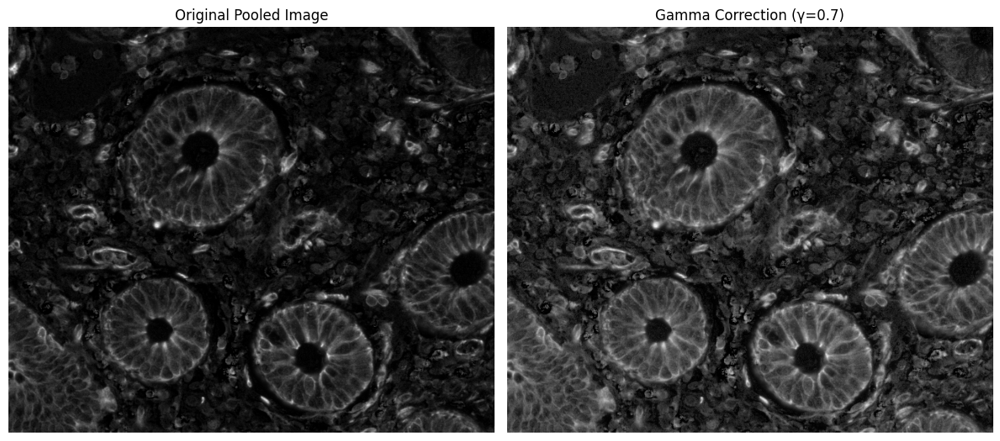

2025-05-08 15:35:07,249 [INFO] >>>> using CPU
2025-05-08 15:35:07,249 [INFO] >>>> using CPU
2025-05-08 15:35:07,250 [INFO] >> cyto3 << model set to be used
2025-05-08 15:35:07,293 [INFO] >>>> loading model /home/lyarab/.cellpose/models/cyto3
2025-05-08 15:35:07,376 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2025-05-08 15:35:07,384 [INFO] channels set to [1, 2]
2025-05-08 15:35:07,384 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2025-05-08 15:35:12,756 [INFO] estimated cell diameter(s) in 5.37 sec
2025-05-08 15:35:12,757 [INFO] >>> diameter(s) = 
2025-05-08 15:35:12,758 [INFO] [16.00, ]
2025-05-08 15:35:12,758 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 15:35:15,280 [INFO] >>>> TOTAL TIME 7.90 sec
Estimated diameter: 15.99753570059363
Segmentation completed with 709 cells detected


/tmp/ipykernel_88/52399387.py:65: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))


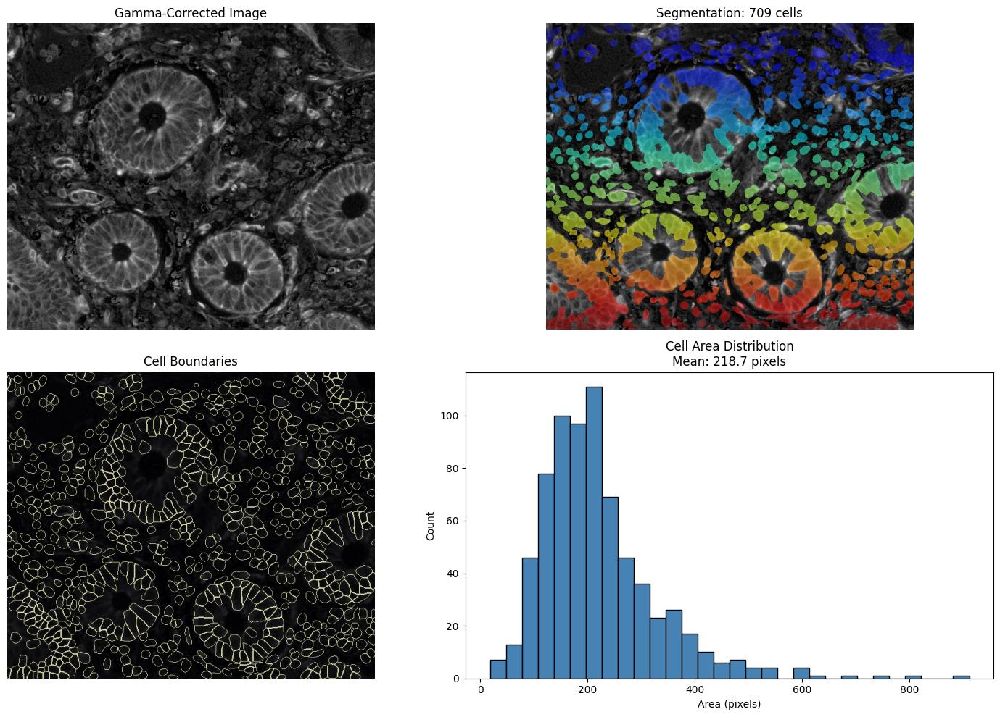

Number of cells detected: 709
Average cell area: 218.73 pixels
Median cell area: 200.00 pixels
Min cell area: 18.00 pixels
Max cell area: 912.00 pixels


In [52]:
# Apply gamma correction with a gamma value of 0.7 (enhances darker regions)
gamma_value = 0.7  # (< 1 brightens dark regions, > 1 darkens bright regions)
gamma_corrected = exposure.adjust_gamma(pooled_img, gamma_value)

# Rescale to ensure 0-255 range for cellpose input
gamma_corrected = exposure.rescale_intensity(gamma_corrected, out_range=(0, 1))
gamma_corrected_uint8 = (gamma_corrected * 255).astype(np.uint8)

# Visualize the gamma correction result
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(pooled_img, cmap='gray')
plt.title('Original Pooled Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(gamma_corrected, cmap='gray')
plt.title(f'Gamma Correction (γ={gamma_value})')
plt.axis('off')

plt.tight_layout()
plt.savefig('gamma_correction.png', dpi=300)
plt.show()

# Create model - using 'cyto' for cytoplasmic segmentation
model = models.Cellpose(model_type='cyto3')

# Set nuclear channel
nuclear_channel = 0  

if nuclear_channel is not None:
    # If we have a nuclear channel, extract it
    if img.shape[0] == 27:  # Channels first
        nuc_img = img[nuclear_channel, :, :]
    else:  # Channels last
        nuc_img = img[:, :, nuclear_channel]
    
    # Normalize nuclear channel
    nuc_img = (nuc_img - np.min(nuc_img)) / (np.max(nuc_img) - np.min(nuc_img)) * 255
    nuc_img = nuc_img.astype(np.uint8)
    
    # Stack images for cellpose (expected shape: [H, W, 2])
    segmentation_input = np.stack([gamma_corrected_uint8, nuc_img], axis=-1)
    channels = [1, 2]  # tell cellpose to use first channel for cytoplasm, second for nucleus
else:
    # If no nuclear channel, use only the gamma-corrected image
    segmentation_input = gamma_corrected_uint8
    channels = [0, 0]  # Use the same channel for both cytoplasm and nucleus detection

# Set diameter
diameter = None  

# Run segmentation with the gamma-corrected image
masks, flows, styles, diams = model.eval([segmentation_input], 
                                       diameter=diameter,
                                       channels=channels)

print(f"Estimated diameter: {diams[0]}")
print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")

# Visualize the segmentation results
plt.figure(figsize=(15, 10))

# Create a custom colormap for mask visualization
mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make 0 values transparent
mask_cmap = ListedColormap(mask_cmap)

# Original gamma-corrected image
plt.subplot(2, 2, 1)
plt.imshow(gamma_corrected, cmap='gray')
plt.title('Gamma-Corrected Image')
plt.axis('off')

# Segmentation result with colored masks
plt.subplot(2, 2, 2)
plt.imshow(gamma_corrected, cmap='gray')
plt.imshow(masks[0], cmap=mask_cmap, alpha=0.5)
plt.title(f'Segmentation: {len(np.unique(masks[0])) - 1} cells')
plt.axis('off')

# Show outlines only for clearer boundary visualization
plt.subplot(2, 2, 3)
outlines = np.zeros_like(gamma_corrected_uint8)
for i in range(1, masks[0].max()+1):
    cell = masks[0] == i
    # Create boundary by dilating and subtracting
    dilated = ndimage.binary_dilation(cell)
    boundary = dilated & ~cell
    outlines[boundary] = 255

plt.imshow(gamma_corrected, cmap='gray')
plt.imshow(outlines, cmap='magma', alpha=0.8)
plt.title('Cell Boundaries')
plt.axis('off')

# Histogram of cell areas
plt.subplot(2, 2, 4)
props = regionprops(masks[0])
cell_areas = [prop.area for prop in props]
plt.hist(cell_areas, bins=30, color='steelblue', edgecolor='black')
plt.title(f'Cell Area Distribution\nMean: {np.mean(cell_areas):.1f} pixels')
plt.xlabel('Area (pixels)')
plt.ylabel('Count')

plt.tight_layout()
plt.savefig('gamma_segmentation_result.png', dpi=300)
plt.show()

# Save the masks
import tifffile
tifffile.imwrite('gamma_segmentation_masks.tif', masks[0].astype(np.uint16))

# Cell analysis statistics
print(f"Number of cells detected: {len(props)}")
print(f"Average cell area: {np.mean(cell_areas):.2f} pixels")
print(f"Median cell area: {np.median(cell_areas):.2f} pixels")
print(f"Min cell area: {np.min(cell_areas):.2f} pixels")
print(f"Max cell area: {np.max(cell_areas):.2f} pixels")

##### Using CLAHE correction

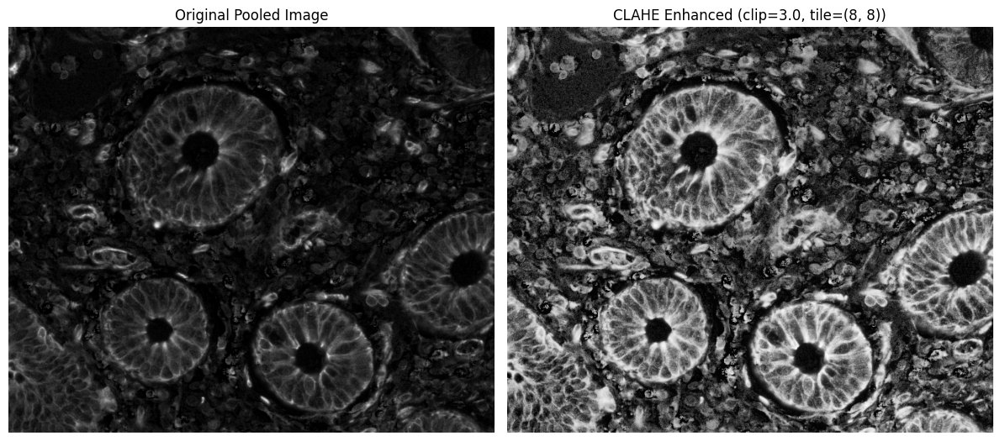

2025-05-08 15:36:17,823 [INFO] >>>> using CPU
2025-05-08 15:36:17,824 [INFO] >>>> using CPU
2025-05-08 15:36:17,824 [INFO] >> cyto3 << model set to be used
2025-05-08 15:36:17,869 [INFO] >>>> loading model /home/lyarab/.cellpose/models/cyto3
2025-05-08 15:36:17,947 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)


In [53]:
# First, convert pooled image to 8-bit unsigned integer for CLAHE
pooled_img_8bit = exposure.rescale_intensity(pooled_img, out_range=(0, 255)).astype(np.uint8)

# clipLimit controls contrast amplification (higher = more contrast but may amplify noise)
# tileGridSize controls the size of the local regions for histogram equalization
clip_limit = 3.0  # Adjust this value based on the image (2.0-4.0 is common)
tile_size = (8, 8)  # Adjust based on image size and cell size

clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
clahe_img = clahe.apply(pooled_img_8bit)

# Visualize the CLAHE enhancement
plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(pooled_img, cmap='gray')
plt.title('Original Pooled Image')
plt.axis('off')

plt.subplot(122)
plt.imshow(clahe_img, cmap='gray')
plt.title(f'CLAHE Enhanced (clip={clip_limit}, tile={tile_size})')
plt.axis('off')

plt.tight_layout()
plt.savefig('clahe_enhancement.png', dpi=300)
plt.show()

# Create model 
model = models.Cellpose(model_type='cyto3')

# Set nuclear channel
nuclear_channel = 0  

if nuclear_channel is not None:
    # If we have a nuclear channel, extract it
    if img.shape[0] == 27:  # Channels first
        nuc_img = img[nuclear_channel, :, :]
    else:  # Channels last
        nuc_img = img[:, :, nuclear_channel]
    
    # Normalize nuclear channel
    nuc_img = (nuc_img - np.min(nuc_img)) / (np.max(nuc_img) - np.min(nuc_img)) * 255
    nuc_img = nuc_img.astype(np.uint8)
    
    # Stack images for cellpose (expected shape: [H, W, 2])
    segmentation_input = np.stack([clahe_img, nuc_img], axis=-1)
    channels = [1, 2]  # tell cellpose to use first channel for cytoplasm, second for nucleus
else:
    # If no nuclear channel, use only the CLAHE-enhanced image
    segmentation_input = clahe_img
    channels = [0, 0]  # Use the same channel for both cytoplasm and nucleus detection

2025-05-08 15:36:17,981 [INFO] channels set to [1, 2]
2025-05-08 15:36:17,982 [INFO] ~~~ ESTIMATING CELL DIAMETER(S) ~~~
2025-05-08 15:36:23,513 [INFO] estimated cell diameter(s) in 5.53 sec
2025-05-08 15:36:23,513 [INFO] >>> diameter(s) = 
2025-05-08 15:36:23,514 [INFO] [15.80, ]
2025-05-08 15:36:23,514 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 15:36:25,934 [INFO] >>>> TOTAL TIME 7.95 sec
Estimated diameter: 15.797308339337178
Segmentation completed with 749 cells detected


/tmp/ipykernel_88/2227203513.py:16: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))


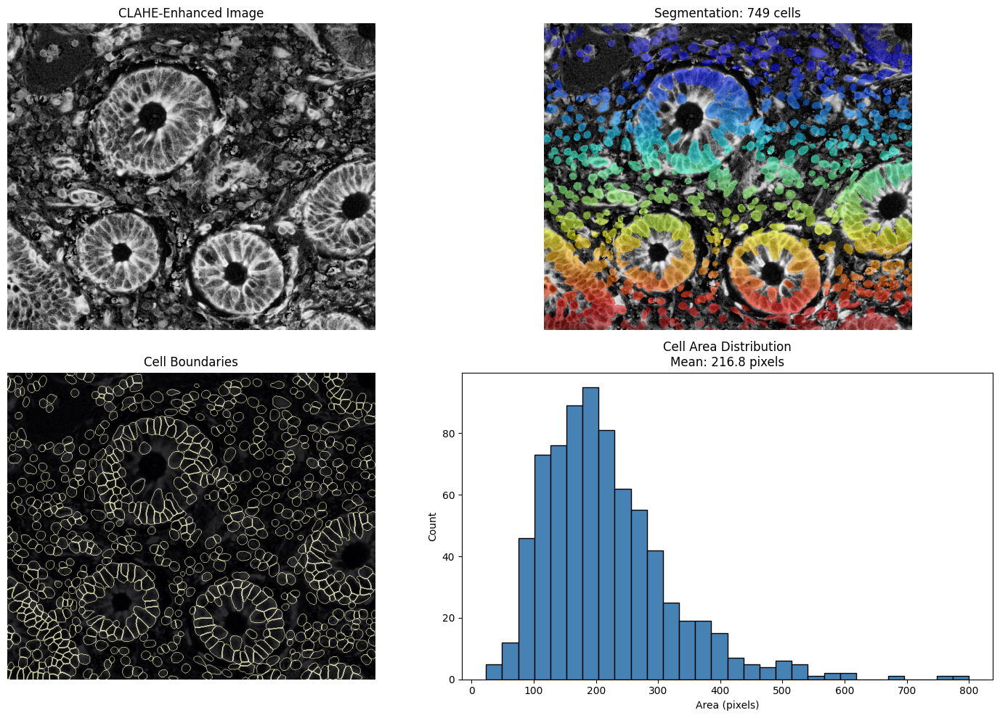

Number of cells detected: 749
Average cell area: 216.77 pixels
Median cell area: 200.00 pixels
Min cell area: 23.00 pixels
Max cell area: 800.00 pixels


In [54]:
# Set diameter
diameter = None  

# Run segmentation with the CLAHE-enhanced image
masks, flows, styles, diams = model.eval([segmentation_input], 
                                       diameter=diameter,
                                       channels=channels)

print(f"Estimated diameter: {diams[0]}")
print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")

# Visualize the segmentation results
plt.figure(figsize=(15, 10))

# Create a custom colormap for mask visualization
mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make 0 values transparent
mask_cmap = ListedColormap(mask_cmap)

# Original CLAHE-enhanced image
plt.subplot(2, 2, 1)
plt.imshow(clahe_img, cmap='gray')
plt.title('CLAHE-Enhanced Image')
plt.axis('off')

# Segmentation result with colored masks
plt.subplot(2, 2, 2)
plt.imshow(clahe_img, cmap='gray')
plt.imshow(masks[0], cmap=mask_cmap, alpha=0.5)
plt.title(f'Segmentation: {len(np.unique(masks[0])) - 1} cells')
plt.axis('off')

# Show outlines only for clearer boundary visualization
plt.subplot(2, 2, 3)
outlines = np.zeros_like(clahe_img)
for i in range(1, masks[0].max()+1):
    cell = masks[0] == i
    # Create boundary by dilating and subtracting
    dilated = ndimage.binary_dilation(cell)
    boundary = dilated & ~cell
    outlines[boundary] = 255

plt.imshow(clahe_img, cmap='gray')
plt.imshow(outlines, cmap='magma', alpha=0.8)
plt.title('Cell Boundaries')
plt.axis('off')

# Histogram of cell areas
plt.subplot(2, 2, 4)
props = regionprops(masks[0])
cell_areas = [prop.area for prop in props]
plt.hist(cell_areas, bins=30, color='steelblue', edgecolor='black')
plt.title(f'Cell Area Distribution\nMean: {np.mean(cell_areas):.1f} pixels')
plt.xlabel('Area (pixels)')
plt.ylabel('Count')

plt.tight_layout()
plt.savefig('clahe_segmentation_result.png', dpi=300)
plt.show()

# Save the masks
import tifffile
tifffile.imwrite('clahe_segmentation_masks.tif', masks[0].astype(np.uint16))

# Cell analysis statistics
print(f"Number of cells detected: {len(props)}")
print(f"Average cell area: {np.mean(cell_areas):.2f} pixels")
print(f"Median cell area: {np.median(cell_areas):.2f} pixels")
print(f"Min cell area: {np.min(cell_areas):.2f} pixels")
print(f"Max cell area: {np.max(cell_areas):.2f} pixels")

#### With CLAHE, changing diameter=20

Image shape: (27, 560, 670)
Selected channel indices:
aSMA: 2
CD31: 5
Pan-Cytokeratin: 8
CD45: 19
aSMA intensity range: 0 - 18621
CD31 intensity range: 0 - 19508
Pan-Cytokeratin intensity range: 0 - 5981
CD45 intensity range: 0 - 2296


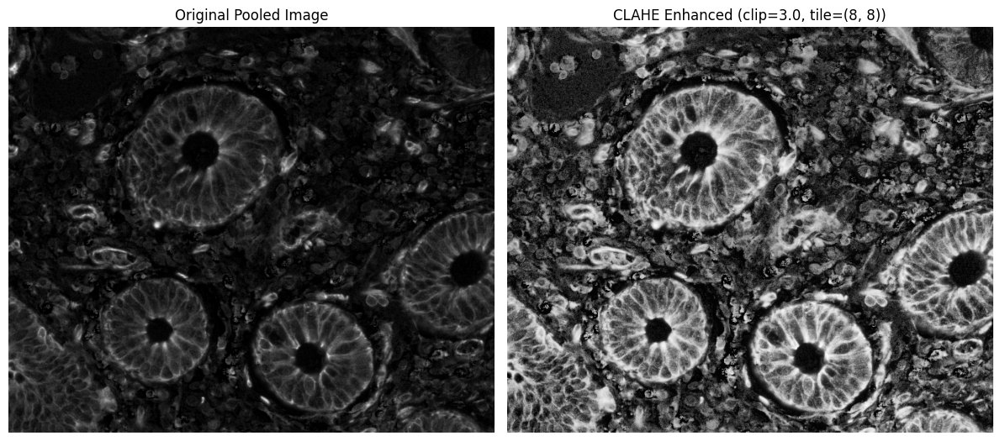

2025-05-08 09:52:05,784 [INFO] >>>> using CPU
2025-05-08 09:52:05,785 [INFO] >>>> using CPU
2025-05-08 09:52:05,785 [INFO] >> cyto3 << model set to be used
2025-05-08 09:52:05,831 [INFO] >>>> loading model /home/lyarab/.cellpose/models/cyto3
2025-05-08 09:52:05,914 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2025-05-08 09:52:05,921 [INFO] channels set to [1, 2]
2025-05-08 09:52:05,921 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 09:52:08,335 [INFO] >>>> TOTAL TIME 2.41 sec
Segmentation completed with 737 cells detected


/tmp/ipykernel_88/4130957737.py:155: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))


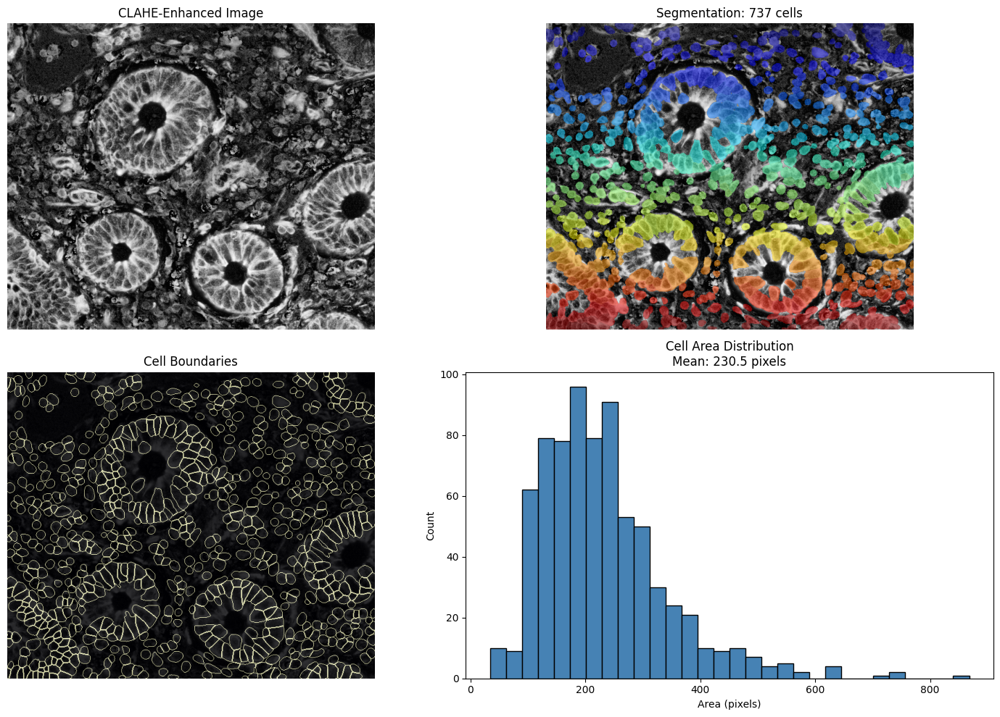

Number of cells detected: 737
Average cell area: 230.55 pixels
Median cell area: 211.00 pixels
Min cell area: 34.00 pixels
Max cell area: 868.00 pixels


In [38]:
diameter = 20  

# Run segmentation with the CLAHE-enhanced image
masks, flows, styles, diams = model.eval([segmentation_input], 
                                       diameter=diameter,
                                       channels=channels)

print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")

# Visualize the segmentation results
plt.figure(figsize=(15, 10))

# Create a custom colormap for mask visualization
mask_cmap = plt.cm.get_cmap('jet')(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make 0 values transparent
mask_cmap = ListedColormap(mask_cmap)

# Original CLAHE-enhanced image
plt.subplot(2, 2, 1)
plt.imshow(clahe_img, cmap='gray')
plt.title('CLAHE-Enhanced Image')
plt.axis('off')

# Segmentation result with colored masks
plt.subplot(2, 2, 2)
plt.imshow(clahe_img, cmap='gray')
plt.imshow(masks[0], cmap=mask_cmap, alpha=0.5)
plt.title(f'Segmentation: {len(np.unique(masks[0])) - 1} cells')
plt.axis('off')

# Show outlines only for clearer boundary visualization
plt.subplot(2, 2, 3)
outlines = np.zeros_like(clahe_img)
for i in range(1, masks[0].max()+1):
    cell = masks[0] == i
    # Create boundary by dilating and subtracting
    dilated = ndimage.binary_dilation(cell)
    boundary = dilated & ~cell
    outlines[boundary] = 255

plt.imshow(clahe_img, cmap='gray')
plt.imshow(outlines, cmap='magma', alpha=0.8)
plt.title('Cell Boundaries')
plt.axis('off')

# Histogram of cell areas
plt.subplot(2, 2, 4)
props = regionprops(masks[0])
cell_areas = [prop.area for prop in props]
plt.hist(cell_areas, bins=30, color='steelblue', edgecolor='black')
plt.title(f'Cell Area Distribution\nMean: {np.mean(cell_areas):.1f} pixels')
plt.xlabel('Area (pixels)')
plt.ylabel('Count')

plt.tight_layout()
plt.savefig('clahe_segmentation_result.png', dpi=300)
plt.show()

# Save the masks
import tifffile
tifffile.imwrite('clahe_segmentation_masks.tif', masks[0].astype(np.uint16))

# Cell analysis statistics
print(f"Number of cells detected: {len(props)}")
print(f"Average cell area: {np.mean(cell_areas):.2f} pixels")
print(f"Median cell area: {np.median(cell_areas):.2f} pixels")
print(f"Min cell area: {np.min(cell_areas):.2f} pixels")
print(f"Max cell area: {np.max(cell_areas):.2f} pixels")

### Segment slide 1 col 1 

#### Without CLAHE

In [55]:
# Specify file path
file_path = '/media/Lynn/data/CODEX_cropped/ID_0022110_column_1.ome.ome.tif'

# Read the image
img = imread(file_path)
print(f"Image shape: {img.shape}")

# Define which channels correspond to your markers of interest
channel_indices = {
    'aSMA': 2,          
    'CD31': 5,         
    'Pan-Cytokeratin': 8,  
    'CD45': 19          
}

# Print the selected channels for verification
print("Selected channel indices:")
for marker, index in channel_indices.items():
    print(f"{marker}: {index}")

# Extract channels based on the shape of your image
pooled_img = None

if len(img.shape) == 3:
    if img.shape[0] == 27:  # Channels first [C, H, W]
        # Extract each channel and create a maximum intensity projection
        channels_to_pool = [img[channel_indices[marker], :, :] for marker in channel_indices]
        pooled_img = np.max(channels_to_pool, axis=0)
        
    elif img.shape[2] == 27:  # Channels last [H, W, C]
        # Extract each channel and create a maximum intensity projection
        channels_to_pool = [img[:, :, channel_indices[marker]] for marker in channel_indices]
        pooled_img = np.max(channels_to_pool, axis=0)
    
else:
    print(f"Unexpected image shape: {img.shape}. Please reshape manually.")

print(f"Pooled image shape: {pooled_img.shape}")

# Normalize the pooled image for better contrast if needed
# This can improve segmentation quality
pooled_img = (pooled_img - np.min(pooled_img)) / (np.max(pooled_img) - np.min(pooled_img)) * 255
pooled_img = pooled_img.astype(np.uint8)

# Create model - using 'cyto' for cytoplasmic segmentation instead of 'nuclei'
model = models.Cellpose(model_type='cyto3')

# Set nuclear channel
nuclear_channel = 0  

if nuclear_channel is not None:
    # If we have a nuclear channel, extract it similar to how we extracted the others
    if img.shape[0] == 27:  # Channels first
        nuc_img = img[nuclear_channel, :, :]
    else:  # Channels last
        nuc_img = img[:, :, nuclear_channel]
    
    # Normalize nuclear channel
    nuc_img = (nuc_img - np.min(nuc_img)) / (np.max(nuc_img) - np.min(nuc_img)) * 255
    nuc_img = nuc_img.astype(np.uint8)
    
    # Stack images for cellpose (expected shape: [H, W, 2])
    segmentation_input = np.stack([pooled_img, nuc_img], axis=-1)
    channels = [1, 2]  # tell cellpose to use first channel for cytoplasm, second for nucleus
else:
    # If no nuclear channel, use only the pooled image
    segmentation_input = pooled_img
    channels = [0, 0]  # Use the same channel for both cytoplasm and nucleus detection

# Set diameter
diameter = 20  

masks, flows, styles, diams = model.eval([segmentation_input], 
                                       diameter=diameter,
                                       channels=channels)

print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")

Image shape: (27, 41487, 4981)
Selected channel indices:
aSMA: 2
CD31: 5
Pan-Cytokeratin: 8
CD45: 19
Pooled image shape: (41487, 4981)
2025-05-08 15:40:02,326 [INFO] >>>> using CPU
2025-05-08 15:40:02,327 [INFO] >>>> using CPU
2025-05-08 15:40:02,327 [INFO] >> cyto3 << model set to be used
2025-05-08 15:40:02,372 [INFO] >>>> loading model /home/lyarab/.cellpose/models/cyto3
2025-05-08 15:40:02,451 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2025-05-08 15:40:04,146 [INFO] channels set to [1, 2]
2025-05-08 15:40:04,146 [INFO] ~~~ FINDING MASKS ~~~
2025-05-08 15:51:58,631 [WARNING] more than 65535 masks in image, masks returned as np.uint32
2025-05-08 15:52:20,093 [INFO] >>>> TOTAL TIME 735.95 sec
Segmentation completed with 99012 cells detected


/tmp/ipykernel_88/3591653677.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet', 256)(np.linspace(0, 1, 256))


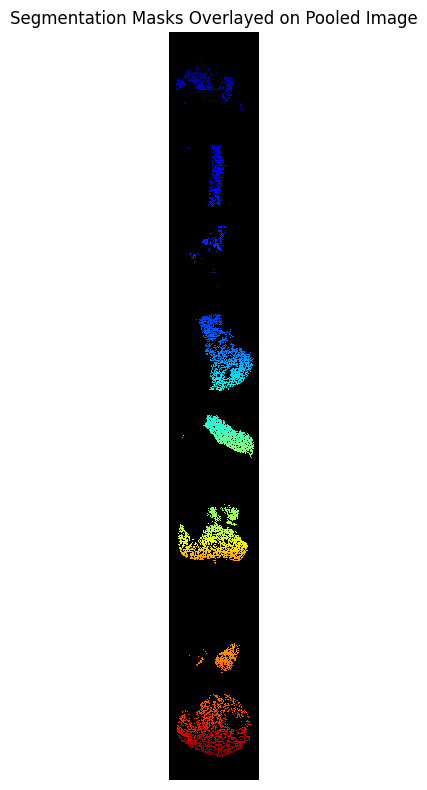

Number of cells detected: 99012
Average cell area: 197.76 pixels
Median cell area: 183.00 pixels
Min cell area: 15.00 pixels
Max cell area: 3105.00 pixels


In [59]:
# Create a custom colormap where label 0 (background) is transparent
mask_cmap = plt.cm.get_cmap('jet', 256)(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Make label 0 fully transparent
mask_cmap = ListedColormap(mask_cmap)

# Plot and save the overlay: pooled image + segmentation mask
plt.figure(figsize=(8, 8))
plt.imshow(pooled_img, cmap='gray')  # Grayscale background
plt.imshow(masks[0], cmap=mask_cmap, interpolation='none')  # Colorful segmentation overlay
plt.title('Segmentation Masks Overlayed on Pooled Image')
plt.axis('off')
plt.tight_layout()
plt.savefig('slide_1_c1_masks_overlayed.png', dpi=300)
plt.show()

# Save the segmentation mask as TIFF
tifffile.imwrite('slide1_c1_segmentation_masks.tif', masks[0].astype(np.uint16))

# Cell analysis statistics
props = regionprops(masks[0])
cell_areas = [prop.area for prop in props]
print(f"Number of cells detected: {len(props)}")
print(f"Average cell area: {np.mean(cell_areas):.2f} pixels")
print(f"Median cell area: {np.median(cell_areas):.2f} pixels")
print(f"Min cell area: {np.min(cell_areas):.2f} pixels")
print(f"Max cell area: {np.max(cell_areas):.2f} pixels")

#### With CLAHE

In [60]:
# Specify file path
file_path = '/media/Lynn/data/CODEX_cropped/ID_0022110_column_1.ome.ome.tif'

# Read the image
img = imread(file_path)
print(f"Image shape: {img.shape}")

# Define which channels correspond to your markers of interest
channel_indices = {
    'aSMA': 2,          
    'CD31': 5,         
    'Pan-Cytokeratin': 8,  
    'CD45': 19          
}

# Print the selected channels for verification
print("Selected channel indices:")
for marker, index in channel_indices.items():
    print(f"{marker}: {index}")

# Extract channels based on the shape of your image
pooled_img = None

if len(img.shape) == 3:
    if img.shape[0] == 27:  # Channels first [C, H, W]
        # Extract each channel for individual analysis and weighting
        channel_images = {}
        for marker, idx in channel_indices.items():
            channel_images[marker] = img[idx, :, :]
            print(f"{marker} intensity range: {np.min(channel_images[marker])} - {np.max(channel_images[marker])}")
        
        # Method: Weighted sum with normalization
        normalized_channels = {}
        for marker, channel in channel_images.items():
            # Normalize each channel to 0-1 range
            if np.max(channel) > np.min(channel):  # Avoid division by zero
                normalized_channels[marker] = (channel - np.min(channel)) / (np.max(channel) - np.min(channel))
            else:
                normalized_channels[marker] = np.zeros_like(channel)
        
        # Equal weights to all channels (can be adjusted based on marker importance)
        weights = {marker: 1.0 for marker in channel_indices}
        
        # Create weighted sum
        pooled_img_weighted = np.zeros_like(normalized_channels[list(normalized_channels.keys())[0]], dtype=float)
        for marker, channel in normalized_channels.items():
            pooled_img_weighted += weights[marker] * channel
        
        # Normalize the result
        if np.max(pooled_img_weighted) > np.min(pooled_img_weighted):
            pooled_img_weighted = (pooled_img_weighted - np.min(pooled_img_weighted)) / (np.max(pooled_img_weighted) - np.min(pooled_img_weighted))
        
        pooled_img = pooled_img_weighted
        
    elif img.shape[2] == 27:  # Channels last [H, W, C]
        # Same operations but for channels-last format
        channel_images = {}
        for marker, idx in channel_indices.items():
            channel_images[marker] = img[:, :, idx]
            print(f"{marker} intensity range: {np.min(channel_images[marker])} - {np.max(channel_images[marker])}")
        
        # Method: Weighted sum
        normalized_channels = {}
        for marker, channel in channel_images.items():
            if np.max(channel) > np.min(channel):
                normalized_channels[marker] = (channel - np.min(channel)) / (np.max(channel) - np.min(channel))
            else:
                normalized_channels[marker] = np.zeros_like(channel)
        
        weights = {marker: 1.0 for marker in channel_indices}
        
        pooled_img_weighted = np.zeros_like(normalized_channels[list(normalized_channels.keys())[0]], dtype=float)
        for marker, channel in normalized_channels.items():
            pooled_img_weighted += weights[marker] * channel
        
        if np.max(pooled_img_weighted) > np.min(pooled_img_weighted):
            pooled_img_weighted = (pooled_img_weighted - np.min(pooled_img_weighted)) / (np.max(pooled_img_weighted) - np.min(pooled_img_weighted))
        
        pooled_img = pooled_img_weighted
    
else:
    print(f"Unexpected image shape: {img.shape}. Please reshape manually.")


# First, convert pooled image to 8-bit unsigned integer for CLAHE
pooled_img_8bit = exposure.rescale_intensity(pooled_img, out_range=(0, 255)).astype(np.uint8)

# Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)
# clipLimit controls contrast amplification (higher = more contrast but may amplify noise)
# tileGridSize controls the size of the local regions for histogram equalization
clip_limit = 3.0  # Adjust this value based on image (2.0-4.0 is common)
tile_size = (8, 8)  # Adjust based on image size and cell size

clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_size)
clahe_img = clahe.apply(pooled_img_8bit)

# Create model - using 'cyto' for cytoplasmic segmentation
model = models.Cellpose(model_type='cyto3')

# Set nuclear channel
nuclear_channel = 0  

if nuclear_channel is not None:
    # If we have a nuclear channel, extract it
    if img.shape[0] == 27:  # Channels first
        nuc_img = img[nuclear_channel, :, :]
    else:  # Channels last
        nuc_img = img[:, :, nuclear_channel]
    
    # Normalize nuclear channel
    nuc_img = (nuc_img - np.min(nuc_img)) / (np.max(nuc_img) - np.min(nuc_img)) * 255
    nuc_img = nuc_img.astype(np.uint8)
    
    # Stack images for cellpose (expected shape: [H, W, 2])
    segmentation_input = np.stack([clahe_img, nuc_img], axis=-1)
    channels = [1, 2]  # tell cellpose to use first channel for cytoplasm, second for nucleus
else:
    # If no nuclear channel, use only the CLAHE-enhanced image
    segmentation_input = clahe_img
    channels = [0, 0]  # Use the same channel for both cytoplasm and nucleus detection

# Set diameter
diameter = 20  

# Run segmentation with the CLAHE-enhanced image
masks, flows, styles, diams = model.eval([segmentation_input], 
                                       diameter=diameter,
                                       channels=channels)

print(f"Segmentation completed with {len(np.unique(masks[0])) - 1} cells detected")

Image shape: (27, 41487, 4981)
Selected channel indices:
aSMA: 2
CD31: 5
Pan-Cytokeratin: 8
CD45: 19
aSMA intensity range: 0 - 31281
CD31 intensity range: 0 - 63761
Pan-Cytokeratin intensity range: 0 - 25486
CD45 intensity range: 0 - 58076
2025-05-09 10:02:32,321 [INFO] >>>> using CPU
2025-05-09 10:02:32,322 [INFO] >>>> using CPU
2025-05-09 10:02:32,322 [INFO] >> cyto3 << model set to be used
2025-05-09 10:02:32,365 [INFO] >>>> loading model /home/lyarab/.cellpose/models/cyto3
2025-05-09 10:02:32,446 [INFO] >>>> model diam_mean =  30.000 (ROIs rescaled to this size during training)
2025-05-09 10:02:34,136 [INFO] channels set to [1, 2]
2025-05-09 10:02:34,137 [INFO] ~~~ FINDING MASKS ~~~
2025-05-09 10:17:14,494 [WARNING] more than 65535 masks in image, masks returned as np.uint32
2025-05-09 10:17:36,111 [INFO] >>>> TOTAL TIME 901.98 sec
Segmentation completed with 99290 cells detected


/tmp/ipykernel_88/425499596.py:2: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  mask_cmap = plt.cm.get_cmap('jet', 256)(np.linspace(0, 1, 256))


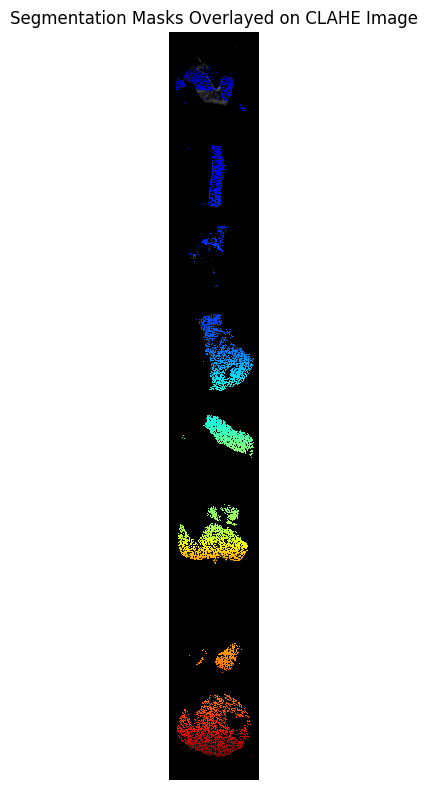

Number of cells detected: 99290
Average cell area: 197.51 pixels
Median cell area: 181.00 pixels
Min cell area: 16.00 pixels
Max cell area: 2795.00 pixels


In [61]:
# Create a custom colormap where label 0 (background) is transparent
mask_cmap = plt.cm.get_cmap('jet', 256)(np.linspace(0, 1, 256))
mask_cmap[0] = [0, 0, 0, 0]  # Transparent background
mask_cmap = ListedColormap(mask_cmap)

# Plot and save the segmentation mask overlayed on the CLAHE image
plt.figure(figsize=(8, 8))
plt.imshow(clahe_img, cmap='gray')  # Background CLAHE-enhanced image
plt.imshow(masks[0], cmap=mask_cmap, interpolation='none')  # Overlay mask
plt.title('Segmentation Masks Overlayed on CLAHE Image')
plt.axis('off')
plt.tight_layout()
plt.savefig('slide_1_c1_clahe_masks_overlayed.png', dpi=300)
plt.show()

# Save the segmentation mask as TIFF
tifffile.imwrite('slide_1_c1_clahe_segmentation_masks.tif', masks[0].astype(np.uint16))

# Cell analysis statistics
props = regionprops(masks[0])
cell_areas = [prop.area for prop in props]
print(f"Number of cells detected: {len(props)}")
print(f"Average cell area: {np.mean(cell_areas):.2f} pixels")
print(f"Median cell area: {np.median(cell_areas):.2f} pixels")
print(f"Min cell area: {np.min(cell_areas):.2f} pixels")
print(f"Max cell area: {np.max(cell_areas):.2f} pixels")